<a href="https://colab.research.google.com/github/CodeWithCharan/AI-Mario/blob/main/Mario_AI_1_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!cat /etc/*release

DISTRIB_ID=Ubuntu
DISTRIB_RELEASE=22.04
DISTRIB_CODENAME=jammy
DISTRIB_DESCRIPTION="Ubuntu 22.04.2 LTS"
PRETTY_NAME="Ubuntu 22.04.2 LTS"
NAME="Ubuntu"
VERSION_ID="22.04"
VERSION="22.04.2 LTS (Jammy Jellyfish)"
VERSION_CODENAME=jammy
ID=ubuntu
ID_LIKE=debian
HOME_URL="https://www.ubuntu.com/"
SUPPORT_URL="https://help.ubuntu.com/"
BUG_REPORT_URL="https://bugs.launchpad.net/ubuntu/"
PRIVACY_POLICY_URL="https://www.ubuntu.com/legal/terms-and-policies/privacy-policy"
UBUNTU_CODENAME=jammy


In [ ]:
!nvidia-smi

Sat Nov 11 18:17:59 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   59C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## 1. Python version

In [ ]:
!python3 --version

Python 3.10.12


## 2. Setting up Dependencies

In [ ]:
# degrade setuptools and wheel (Note: Please restart runtime after this line)
!pip install setuptools==65.5.0 "wheel<0.40.0"

In [ ]:
# install gym version 0.21.0
!pip install gym==0.21.0

In [ ]:
# install gym super mario bro version 7.3.0 and nes_py version 8.2.1
!pip install -qq gym-super-mario-bros==7.3.0 nes_py==8.2.1

In [ ]:
# Update package lists (Linux)
!apt -qq update

# Install XVFB (X Virtual FrameBuffer) for headless graphical applications (Linux)
!apt install -y -qq xvfb

# Install pyvirtualdisplay for managing virtual displays
!pip install -qq pyvirtualdisplay

In [ ]:
# Install stable baselines for RL stuff
!pip -qq install stable-baselines3[extra]==1.8.0

## 3. Hyperparameters and Configuration Settings

In [ ]:
CHECK_FREQ_NUMB = 10000  # Frequency of checking and saving model
TOTAL_TIMESTEP_NUMB = 500000  # Total number of timesteps for training
LEARNING_RATE = 0.00005  # Learning rate for the training process
N_STEPS = 512  # Number of steps in each batch of training data
GAMMA = 0.9  # Discount factor for future rewards
BATCH_SIZE = 64  # Batch size for training
N_EPOCHS = 10  # Number of training epochs
DOWN_SAMPLE_RATE = 3  # Rate of downsampling data
SKIP_NUMB = 2  # Number of steps to skip
EPISODE_NUMBERS = 20  # Total number of episodes for the training

## 4. Setup Mario Environment

In [ ]:
# Import the game
import gym_super_mario_bros
# Import the Joypad wrapper
from nes_py.wrappers import JoypadSpace
# Import the SIMPLIFIED controls
from gym_super_mario_bros.actions import SIMPLE_MOVEMENT

import gym
import numpy as np

In [ ]:
# Import os for file path management
import os
# Import PPO for algos
from stable_baselines3 import PPO
# Import Base Callback for saving models
from stable_baselines3.common.callbacks import BaseCallback

In [ ]:
# Initialize Super Mario Bros environment - Stage 1-1
env = gym_super_mario_bros.make("SuperMarioBros-1-1-v0")

# Configure joystick inputs
env = JoypadSpace(env, SIMPLE_MOVEMENT)

In [ ]:
# Reset the environment to its initial state
env.reset()

# Take a step in the environment with a specified action (e.g., action=0)
state, reward, done, info = env.step(action=0)

# Print the state shape, reward, done flag, and additional information
print(f"{state.shape},\n {reward},\n {done},\n {info}")

(240, 256, 3),
 0.0,
 False,
 {'coins': 0, 'flag_get': False, 'life': 2, 'score': 0, 'stage': 1, 'status': 'small', 'time': 400, 'world': 1, 'x_pos': 40, 'x_pos_screen': 40, 'y_pos': 79}


In [ ]:
# Import the required classes from the gym.spaces module
from gym.spaces import Box, Discrete

# Define a function to print information about the given space
def print_spaces(space):
    # Print the type of space (e.g., Box or Discrete)
    print(space)

    # If the space is of type Box, print its minimum and maximum values
    if isinstance(space, Box):
        print('min:', space.low)
        print('max:', space.high)

    # If the space is of type Discrete, print its minimum and maximum values
    if isinstance(space, Discrete):
        print('min:', 0)
        print('max:', space.n - 1)

In [ ]:
# Call the print_spaces function to print information about the action space of the environment
print_spaces(env.action_space)

Discrete(7)
min: 0
max: 6


In [ ]:
# Call the print_spaces function to print information about the observation space of the environment
print_spaces(env.observation_space)

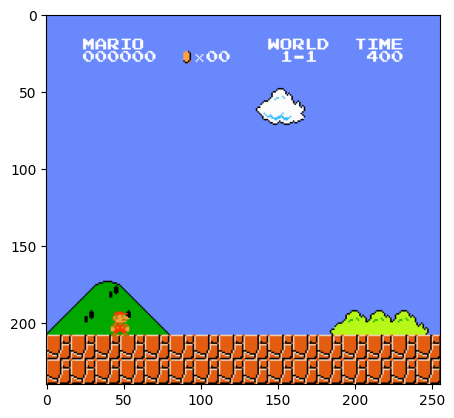

In [ ]:
# Import the matplotlib library for plotting
import matplotlib.pyplot as plt

# Display an image of the state
plt.imshow(state)

## 5. Preprocess Environment

In [ ]:
# Import Frame Stacker Wrapper and GrayScaling Wrapper
from gym.wrappers import GrayScaleObservation
# Import Vectorization Wrappers
from stable_baselines3.common.vec_env import VecFrameStack, DummyVecEnv

In [ ]:
# Custom Gym wrapper to skip frames in the environment
class SkipFrame(gym.Wrapper):
    def __init__(self, env, skip):
        super().__init__(env)
        self._skip = skip

    def step(self, action):
        total_reward = 0.0
        done = False
        for i in range(self._skip):
            obs, reward, done, info = self.env.step(action)
            total_reward += reward
            if done:
                break
        return obs, total_reward, done, info

# Custom Gym observation wrapper to resize observations
class ResizeObservation(gym.ObservationWrapper):
    def __init__(self, env, shape):
        super().__init__(env)
        if isinstance(shape, int):
            self.shape = (shape, shape)
        else:
            self.shape = tuple(shape)

        obs_shape = self.shape + self.observation_space.shape[2:]
        self.observation_space = Box(low=0, high=255, shape=obs_shape, dtype=np.uint8)

    def observation(self, observation):
        transforms = T.Compose(
            [T.Resize(self.shape), T.Normalize(0, 255)]
        )
        observation = transforms(observation).squeeze(0)
        return observation

In [ ]:
# Reference:
# https://github.com/openai/baselines/blob/master/baselines/common/retro_wrappers.py

# Custom Gym wrapper for stochastic frame skipping
class StochasticFrameSkip(gym.Wrapper):
    def __init__(self, env, n, stickprob):
        gym.Wrapper.__init__(self, env)
        self.n = n
        self.stickprob = stickprob
        self.curac = None
        self.rng = np.random.RandomState()
        self.supports_want_render = hasattr(env, "supports_want_render")

    def reset(self, **kwargs):
        self.curac = None
        return self.env.reset(**kwargs)

    def step(self, ac):
        done = False
        totrew = 0
        for i in range(self.n):
            # First step after reset, use action
            if self.curac is None:
                self.curac = ac
            # First substep, delay with probability=stickprob
            elif i==0:
                if self.rng.rand() > self.stickprob:
                    self.curac = ac
            # Second substep, new action definitely kicks in
            elif i==1:
                self.curac = ac
            if self.supports_want_render and i<self.n-1:
                ob, rew, done, info = self.env.step(self.curac, want_render=False)
            else:
                ob, rew, done, info = self.env.step(self.curac)
            totrew += rew
            if done: break
        return ob, totrew, done, info

    def seed(self, s):
        self.rng.seed(s)

In [ ]:
# Import OpenCV for image processing
import cv2

# Reference:
# https://github.com/openai/baselines/blob/master/baselines/common/retro_wrappers.py

# Custom Gym observation wrapper for downsampling images
class Downsample(gym.ObservationWrapper):
    def __init__(self, env, ratio):
        """
        Downsample images by a factor of ratio
        """
        gym.ObservationWrapper.__init__(self, env)
        (oldh, oldw, oldc) = env.observation_space.shape
        newshape = (oldh//ratio, oldw//ratio, oldc)
        self.observation_space = gym.spaces.Box(low=0, high=255,
            shape=newshape, dtype=np.uint8)

    def observation(self, frame):
        height, width, _ = self.observation_space.shape
        frame = cv2.resize(frame, (width, height), interpolation=cv2.INTER_AREA)
        if frame.ndim == 2:
            frame = frame[:,:,None]
        return frame

In [ ]:
# Custom Gym wrapper for modifying rewards and the "done" flag
class CustomRewardAndDoneEnv(gym.Wrapper):
    def __init__(self, env):
        super(CustomRewardAndDoneEnv, self).__init__(env)

    def step(self, action):
        state, reward, done, info = self.env.step(action)

        # Modify the reward (e.g., scaling)
        # reward = reward / 10

        if info["life"] < 2:
            done = True

        return state, reward, done, info

In [ ]:
# Create a Super Mario Bros environment - Stage 1-1
env = gym_super_mario_bros.make("SuperMarioBros-1-1-v0")

# Configure joystick inputs
env = JoypadSpace(env, SIMPLE_MOVEMENT)

# Customize the environment to modify rewards and the "done" flag
env = CustomRewardAndDoneEnv(env)

# Apply frame skipping to the environment
env = SkipFrame(env, skip=SKIP_NUMB)

# Convert observations from color to grayscale while maintaining the same dimensions
env = GrayScaleObservation(env, keep_dim=True)

# Downsample the observations
env = Downsample(env, DOWN_SAMPLE_RATE)

# Create a dummy vectorized environment for training
env = DummyVecEnv([lambda: env])

# Stack frames to create a sequence of observations
env = VecFrameStack(env, 4, channels_order='last')

In [ ]:
# Reset the environment to its initial state
env.reset()

# Take a step in the environment by applying action [0] and get the resulting state, reward, done flag, and additional information
state, reward, done, info = env.step([0])

In [ ]:
# Now, Print information
print(f"{state.shape},\n {reward},\n {done},\n {info}")

(1, 80, 85, 4),
 [0.],
 [False],
 [{'coins': 0, 'flag_get': False, 'life': 2, 'score': 0, 'stage': 1, 'status': 'small', 'time': 400, 'world': 1, 'x_pos': 40, 'x_pos_screen': 40, 'y_pos': 79}]


In [ ]:
# Display all frames in the state using matplotlib
def display_all_frame():
    plt.figure(figsize=(20,16))
    for idx in range(state.shape[3]):
        plt.subplot(1,4,idx+1)
        plt.imshow(state[0][:,:,idx], cmap='gray')
    plt.show()

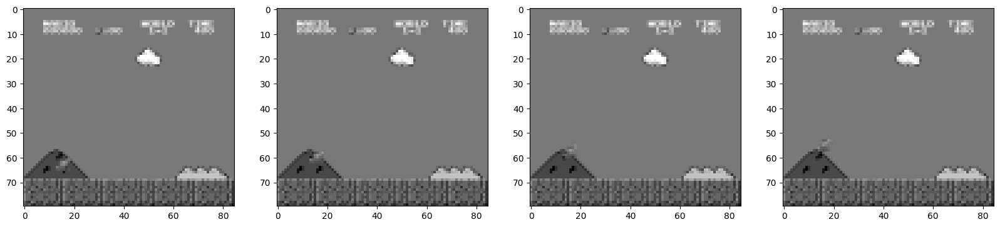

In [ ]:
# Take a step in the environment by an action[2] and get the resulting state, reward, done flag, and info
state, reward, done, info = env.step([2])

# Display all frames in the updated state
display_all_frame()

In [ ]:
# Extract the second channel (index 1) from the first frame of the state
state[0][:,:,1]

array([[140, 140, 140, ..., 140, 140, 140],
       [140, 140, 140, ..., 140, 140, 140],
       [140, 140, 140, ..., 140, 140, 140],
       ...,
       [154, 124, 123, ...,  84, 153,  83],
       [123,  93,  80, ..., 112, 124,  83],
       [116, 103, 122, ..., 113,  83,  55]], dtype=uint8)

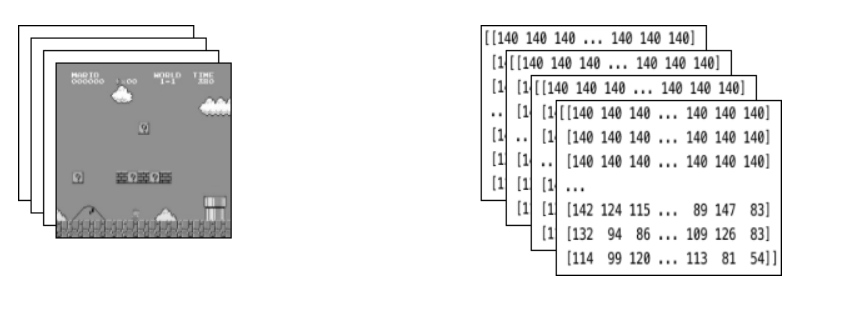

## 6. Train the AI Model

`Note:` If you prefer not to load a pre-trained model and wish to train a new one, please proceed to the next step. You can stop this learning process once you have a good model and move on to the next one.

In [ ]:
# Directory for trained model
CHECKPOINT_DIR = './train/'

# Directory for log files
LOG_DIR = './logs/'

# Filename for reward log
REWARD_LOG_FILENAME = 'reward_log.csv'

In [ ]:
# Append the header line to the reward log file
with open(REWARD_LOG_FILENAME, 'a') as f:
    print('timesteps,reward', file=f)

In [ ]:
# Custom callback for training and logging
class TrainAndLoggingCallback(BaseCallback):
    def __init__(self, check_freq, save_path, verbose=1):
        super(TrainAndLoggingCallback, self).__init__(verbose)
        self.check_freq = check_freq
        self.save_path = save_path

    def _init_callback(self):
        if self.save_path is not None:
            os.makedirs(self.save_path, exist_ok=True)

    def _on_step(self):
        if self.n_calls % self.check_freq == 0:
            model_path = os.path.join(self.save_path, 'best_model_{}'.format(self.n_calls))
            self.model.save(model_path)

            total_reward = [0] * EPISODE_NUMBERS
            total_time = [0] * EPISODE_NUMBERS
            best_reward = 0

            for i in range(EPISODE_NUMBERS):
                state = env.reset()  # reset for each new trial
                done = False
                total_reward[i] = 0
                total_time[i] = 0
                while not done and total_time[i] < 10000:
                    action, _ = model.predict(state)
                    state, reward, done, info = env.step(action)
                    total_reward[i] += reward[0]
                    total_time[i] += 1

                if total_reward[i] > best_reward:
                    best_reward = total_reward[i]
                    best_epoch = self.n_calls

                state = env.reset()  # reset for each new trial

            print('time steps:', self.n_calls, '/', TOTAL_TIMESTEP_NUMB)
            print('average reward:', (sum(total_reward) / EPISODE_NUMBERS),
                  'average time:', (sum(total_time) / EPISODE_NUMBERS),
                  'best_reward:', best_reward)

            with open(REWARD_LOG_FILENAME, 'a') as f:
                print(self.n_calls, ',', sum(total_reward) / EPISODE_NUMBERS, file=f)

        return True

In [ ]:
# Setup model saving callback
callback = TrainAndLoggingCallback(check_freq=CHECK_FREQ_NUMB, save_path=CHECKPOINT_DIR)

In [ ]:
# AI model started
model = PPO('CnnPolicy', env, verbose=1, tensorboard_log=LOG_DIR, learning_rate=LEARNING_RATE, n_steps=N_STEPS,
              batch_size=BATCH_SIZE, n_epochs=N_EPOCHS, gamma=GAMMA)

Using cuda device
Wrapping the env in a VecTransposeImage.


In [ ]:
# Training the AI model, this is where the AI model starts to learn
%%time
model.learn(total_timesteps=TOTAL_TIMESTEP_NUMB, callback=callback)

## 7. Test the AI model

**Reference:** https://safjan.com/download-data-google-drive-colab-gdown/

Download trained model from Google Drive in Google Colab Using `"gdown"`

`Step 1:` Obtain the File's Shareable Link

To download data from your Google Drive, you must first ensure the file or folder is publicly accessible. To do this, right-click on the file or folder in your Google Drive, select "Get Shareable Link," and set the sharing settings to "Anyone with the link."

`Step 2:` Retrieve the ID from the Shareable Link

Upon obtaining the shareable link, extract the file's ID from the link. The ID is typically found after "https://drive.google.com/file/d/". For instance, if your link is "https://drive.google.com/file/d/ABC12345XYZ/view," then "ABC12345XYZ" is the file's ID.

`Step 3:` Download trained model Using the gdown command. The following code demonstrates how to do this:

```
import gdown

file_id = "ABC12345XYZ"  # Replace this with your file's ID
output_file = "data_file.ext"  # Replace "data_file.ext" with the desired output filename and extension

gdown.download(f"https://drive.google.com/uc?id={file_id}", output_file)
```

In [ ]:
import gdown
file_id = "1qlk8sSXodnKq2yohqgbvBOyuwwMpYHx7"
output_file = "mario_AI_1_1.zip"

gdown.download(f"https://drive.google.com/uc?id={file_id}", output_file)

Downloading...
From: https://drive.google.com/uc?id=1qlk8sSXodnKq2yohqgbvBOyuwwMpYHx7
To: /content/mario_AI_1_1.zip
100%|██████████| 17.7M/17.7M [00:00<00:00, 64.5MB/s]


'mario_AI_1_1.zip'

In [ ]:
# Load the model
model = PPO.load('mario_AI_1_1.zip')

/usr/local/lib/python3.10/dist-packages/stable_baselines3/common/save_util.py:166: UserWarning: Could not deserialize object lr_schedule. Consider using `custom_objects` argument to replace this object.
Exception: 'bytes' object cannot be interpreted as an integer
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/stable_baselines3/common/save_util.py:166: UserWarning: Could not deserialize object clip_range. Consider using `custom_objects` argument to replace this object.
Exception: 'bytes' object cannot be interpreted as an integer
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/stable_baselines3/common/base_class.py:728: UserWarning: You are probably loading a model saved with SB3 < 1.7.0, we deactivated exact_match so you can save the model again to avoid issues in the future (see https://github.com/DLR-RM/stable-baselines3/issues/1233 for more info). Original error: Error(s) in loading state_dict for ActorCriticCnnPolicy:
	Missing key(s) in state_dict: "pi_features_

`Note:`

- If the `'best_reward' exceeds 3000`, you have likely cleared the level successfully.

- If you receive a low reward, `consider trying again several times for better results.`

- If you do not achieve a high reward (more than 3000), you may have failed to clear the level.

In [ ]:
import copy

total_reward = [0] * EPISODE_NUMBERS
total_time = [0] * EPISODE_NUMBERS
best_reward = 0
frames_best = []

for i in range(EPISODE_NUMBERS):
    state = env.reset()  # reset for each new trial
    done = False
    total_reward[i] = 0
    total_time[i] = 0
    frames = []
    while not done and total_time[i] < 10000:
        action, _ = model.predict(state)
        state, reward, done, info = env.step(action)
        total_reward[i] += reward[0]
        total_time[i] += 1
        frames.append(copy.deepcopy(env.render(mode = 'rgb_array')))

    if total_reward[i] > best_reward:
        best_reward = total_reward[i]
        frames_best = copy.deepcopy(frames)

    print('test episode:', i, 'reward:', total_reward[i], 'time:', total_time[i])

print('average reward:', (sum(total_reward) / EPISODE_NUMBERS),
      'average time:', (sum(total_time) / EPISODE_NUMBERS),
      'best_reward:', best_reward)

test episode: 0 reward: 626.0 time: 418
test episode: 1 reward: 1028.0 time: 693
test episode: 2 reward: 1291.0 time: 795
test episode: 3 reward: 235.0 time: 77
test episode: 4 reward: 1334.0 time: 437
test episode: 5 reward: 1690.0 time: 464
test episode: 6 reward: 1133.0 time: 525
test episode: 7 reward: 816.0 time: 273
test episode: 8 reward: 638.0 time: 293
test episode: 9 reward: 1327.0 time: 336
test episode: 10 reward: 250.0 time: 61
test episode: 11 reward: 1026.0 time: 465
test episode: 12 reward: 812.0 time: 313
test episode: 13 reward: 234.0 time: 72
test episode: 14 reward: 3039.0 time: 827
test episode: 15 reward: 811.0 time: 324
test episode: 16 reward: 245.0 time: 62
test episode: 17 reward: 606.0 time: 172
test episode: 18 reward: 1574.0 time: 402
test episode: 19 reward: 611.0 time: 176
average reward: 966.3 average time: 359.25 best_reward: 3039.0


`Note:`

To save and play videos from saved image logs, please consider the following:

- If there are many images, generating and checking the video may take time. You can thin out the images to speed up the process.

- Enter the percentage to thin out the images (the larger the number, the more images will be thinned out).


In [ ]:
# Set the SKIP_RATE here for thinning out the images
SKIP_RATE = 2

In [ ]:
if SKIP_RATE == 1:
  frames_new = np.array(frames_best)
else:
  np_frames = np.array(frames_best)
  frames_new = np_frames[::SKIP_RATE].tolist()

Generate a video that can be viewed on Google Colab. If you press the play button after generation, you can watch AI Mario's gameplay.

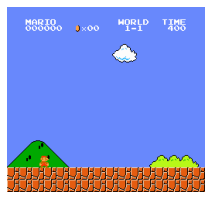

In [ ]:
import matplotlib.animation
from IPython.display import HTML

matplotlib.rcParams['animation.embed_limit'] = 2**128
plt.figure(figsize=(frames[0].shape[1] / 72.0, frames[0].shape[0] / 72.0), dpi = 72)
patch = plt.imshow(frames_new[0])
plt.axis('off')
animate = lambda i: patch.set_data(frames_new[i])
ani = matplotlib.animation.FuncAnimation(plt.gcf(), animate, frames=len(frames_new), interval = 50)
HTML(ani.to_jshtml())

## Generate GIF from AI Best Gameplay

Reference: https://stable-baselines3.readthedocs.io/en/master/guide/examples.html#bonus-make-a-gif-of-a-trained-agent

In [ ]:
import imageio
imageio.mimsave('MarioAI_1_1.gif', [np.array(img) for i, img in enumerate(frames_best) if i%SKIP_RATE == 0], fps=29)

In [ ]:
from google.colab import files
files.download('MarioAI_1_1.gif')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Summary

In this notebook, we have successfully created an Mario AI agent capable of clearing stage 1-1 in the Super Mario Bros game.

## References:
- https://github.com/nicknochnack/MarioRL
- https://stable-baselines3.readthedocs.io/en/master/guide/examples.html
- https://github.com/YuansongFeng/MadMario
- https://youtu.be/dWmJ5CXSKdw?si=pjU2bHCGA_zMel5h